**Author:** Elias Rafael Ruiz-Morales

**Institution:** Wellcome Sanger institute

**September, 2022**

Here I annotate the trophoblasts by including cell sub-types. 


---

# Trophoblast fine annotation

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import os
import sys
import anndata

import matplotlib.pyplot as plt
import matplotlib as mpl


In [2]:
#adata_ExplantNorm=sc.read('../results/scVI/S9_scVIintegrated_fetalSurgSubset_adata_latent20_20220523.h5ad')

In [3]:
def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = '../results/images/annotationFine/'
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

sys.executable

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
anndata             0.7.5
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyterlab_server   2.3.0
kiwisolver          1.3.1
legacy_api_wrap     0.0.0


'/opt/conda/bin/python'

In [4]:
def identityTransfer(adata_CellsNewID, adata, field='cell_type'):
    
    '''
    Function to transfer the value in a .obs column, modifying only the cells included in adata_CellsNewID
    
    Parameters:
        adata_CellsNewID: anndata object with cells. These should have in their .obs[field] the new values to be transfer to adata
        adata: anndata object to modify. The value in .obs[field] will be modifies for all the cells in adata_CellsNewID
        field: column name in .obs to operate in.
        
     Return:
        anndata object with the metadata modified
        
    '''
    
    #converting categorical into strings to introduce new categories
    adata.obs[field]=adata.obs[field].astype("string")


    #assigning the new categories to the cells in adata
    for cell in adata_CellsNewID.obs.index:
        adata.obs[field][cell] = adata_CellsNewID.obs[field][cell]

    #Returning strings into categorical 
    adata.obs[field]=adata.obs[field].astype("category")
    
    return(adata)

In [5]:
def runTF_IDF(adata, groupby, method='wilcoxon'):
    
    '''
    Function to run TF-IDF and DE analysis. TF-IDF means term-frequency times inverse document-frequency. 
    Its goal is to scale down the impact of tokens that occur very frequently (i.e. less informative)
    than features that occur in a small fraction of the training corpus.
    The the function applies a DE analysis.
    
    Parameters:
        adata: anndata object with cells.
        groupby: column name in .obs to make the DE comparison.
        method: method to use for Differential expression.
    
    Return:
        anndata object with the DE genes stored in adata.uns['rank_genes_groups']
        
    '''
    
    
    counts = anndata.AnnData(X=adata.raw.X, var=adata.raw.var, obs=adata.obs, asview=False)


    #-- Binarize counts matrix (1 if expressed, 0 otherwise)
    adata_bin = epi.pp.binarize(counts, copy=True)
    adata_bin.X.shape


    #-- Compute TF-IDF
    transformer = TfidfTransformer()
    tfidf = transformer.fit_transform(adata_bin.X.T)
    adata_bin.X = tfidf.T
    adata_bin.X.shape


    #-- Compute Mann-Withney test with scanpy
    sc.tl.rank_genes_groups(adata_bin, groupby= groupby, use_raw=False, method=method)

    return(adata_bin)

In [6]:
def Barplot(which_var, adata, var='cell_type', height=3, color = False, suffix= '', fig_format='svg'):
    
    '''
    Function to plot barplots plotting the proportion of cells per catergory in var, coming from each category in which_var.
    
    Parameters:
        which_var: column name in .obs. Contains the categories to contrast.
        adata: anndata object.
        var: column name in .obs. It contains the categories of the cells.
        height: plot height
        color: colors to use
        suffix: string. Suffix to be added at the end of the name of the plot.
    
    Return:
        Saves bar plot as a pdf.
        
    '''
    
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    ax1.set_xlim(0, 100)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
    ax1.figure.savefig(str(sc.settings.figdir)+'/barplot_'+var+'_proportions_'+which_var+ suffix+'.'+fig_format, bbox_inches='tight',
                       dpi=300, orientation='landscape', format= fig_format, optimize=True)

In [7]:
sc.set_figure_params(figsize=(4,4))

## Loading data and visualization

In [8]:
Trophoblasts = sc.read('../results/scVI/snRNA4_raw_scVIintegrated_Trophoblastonly.h5ad')

In [10]:
#LATENT 30
sc.pp.neighbors(Trophoblasts, n_neighbors=15, use_rep="X_scVI_n_latent_20")
sc.tl.umap(Trophoblasts)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


running Leiden clustering
    finished: found 11 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:04)


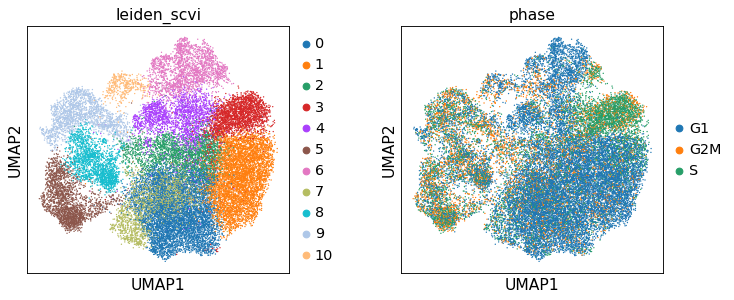

In [17]:

#clustering
sc.tl.leiden(Trophoblasts, key_added="leiden_scvi", resolution=0.6)


sc.pl.umap(Trophoblasts, color=["leiden_scvi",'phase'],
           wspace=0.3, size=6)

### Loading the predictions using the trophoblasts from the MFI as training set
Only the trophoblasts were annotated.

In [12]:
#Loading the predictions using
prediction= pd.read_csv('../results/log_regression/logreg_trophoblastOnly_to_explant_HVGs_predictions_20230825.csv', index_col=0)

In [13]:
prediction

,celltype_predictions,probabilities
Pla_HDBR11923126_AAACCCAGTGGACAGT,VCT_p,0.606526
Pla_HDBR11923126_AAACCCATCGTCTACC,SCT,0.998711
Pla_HDBR11923126_AAACGAAGTGGACTGA,SCT,0.999779
Pla_HDBR11923126_AAACGAATCGCAACAT,VCT,0.911019
Pla_HDBR11923126_AAACGCTAGAGTCAAT,SCT,0.995236
...,...,...
Pla_HDBR13661578_TTTCATGAGTCTAGAA,VCT,0.997096
Pla_HDBR13661578_TTTCATGCATTAGGCT,SCT,0.854565
Pla_HDBR13661578_TTTCATGGTATGCTTG,SCT,0.472877
Pla_HDBR13661578_TTTGGAGAGAGCATAT,VCT,0.628645


In [14]:
#Adding the predictions to the metadata
Trophoblasts.obs= Trophoblasts.obs.join(prediction)

In [15]:
Trophoblasts

AnnData object with n_obs × n_vars = 28040 × 36601
    obs: 'sample', 'stage', 'donor', 'hpi', 'infection', 'percent_mito', 'n_counts', 'batch', 'n_genes', 'sample_barcode', 'assignment_SoC', 'donor_deconv', 'donor_souporcell', 'donor_id', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'infection_stage', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden_scvi', 'cell_typeAll', 'stage_perInfection', 'celltype_predictions', 'probabilities'
    var: 'gene_ids', 'feature_types', 'mean', 'std', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: '_scvi', 'donor_id_colors', 'hpi_colors', 'hvg', 'infection_colors', 'is_doublet_colors', 'leiden', 'neighbors', 'sample_colors', 'stage_perInfection_colors', 'umap', 'leiden_scvi_colors', 'phase_colors'
    obsm: 'X_scVI_n_latent_15', 'X_scVI_n_latent_20', 'X_scVI_n_latent_30', 'X_umap', '_scvi_extra_ca

... storing 'celltype_predictions' as categorical


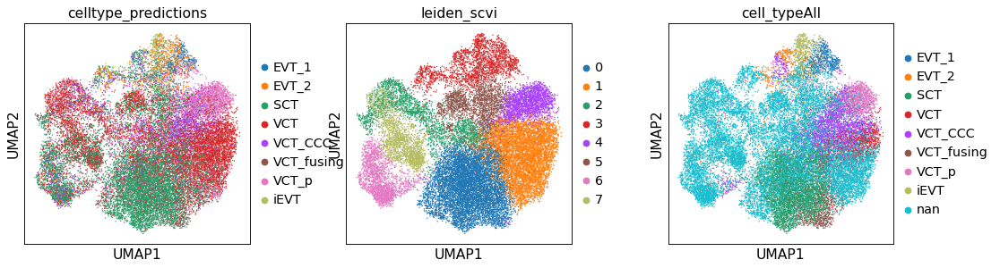

In [16]:
sc.pl.umap(Trophoblasts, color=['celltype_predictions',"leiden_scvi","cell_typeAll"],size=6, wspace=0.3)

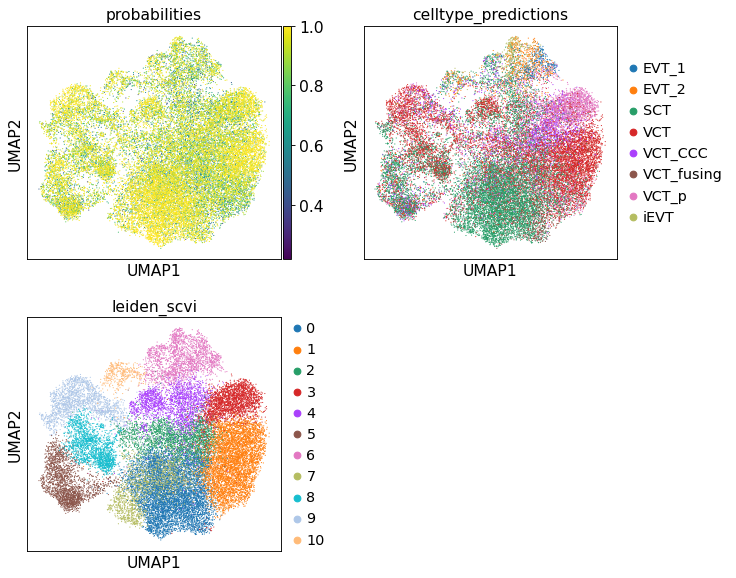

In [18]:
sc.pl.umap(Trophoblasts, color=['probabilities','celltype_predictions',"leiden_scvi"],size=4, ncols=2,
           save='_scVI_latent30_Trophoblasts_LogRegRaw.pdf')


In [19]:
sc.pp.normalize_total(Trophoblasts, target_sum=1e4)
sc.pp.log1p(Trophoblasts)

normalizing counts per cell
    finished (0:00:00)


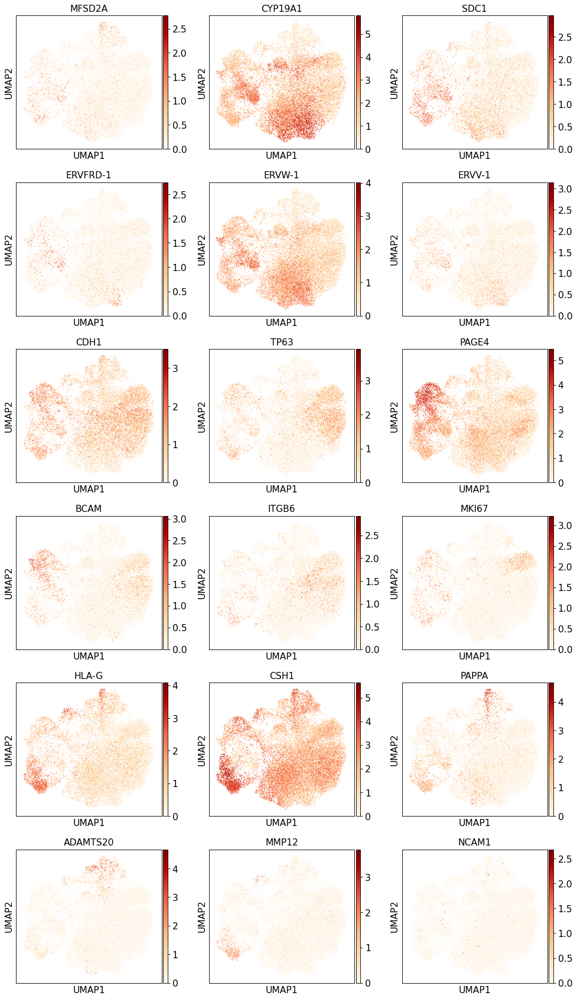

In [20]:
sc.pl.umap(Trophoblasts, color=['MFSD2A', #SCT
                                'CYP19A1','SDC1',#VCT-fusing & SCT
                                'ERVFRD-1','ERVW-1','ERVV-1', #VCT-fusing
                                'CDH1','TP63','PAGE4','BCAM',  #VCT
                                'ITGB6',#VCT-CCC
                                'MKI67', #VCT-P
                         'HLA-G', 'CSH1', 'PAPPA',#EVT
                         'ADAMTS20', #EVT1/2
                         'MMP12','NCAM1',  #eEVT
                         ], color_map='OrRd', ncols=3)

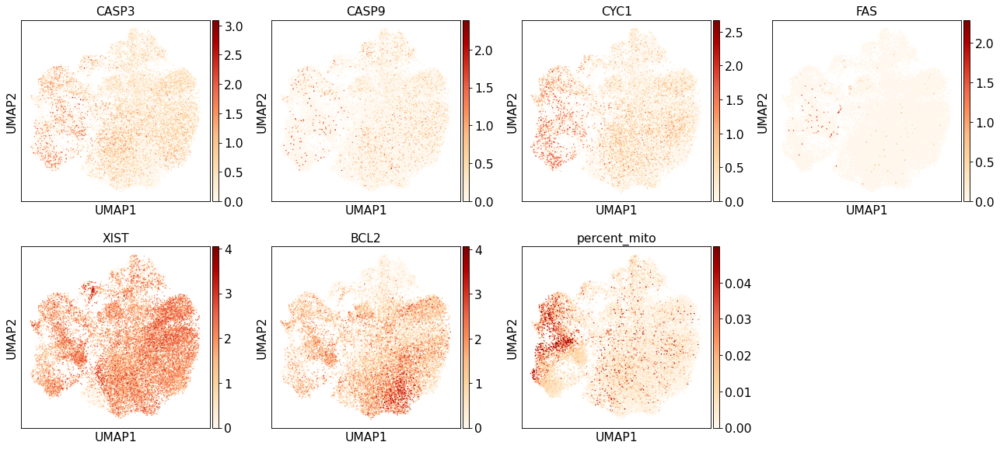

In [21]:
sc.pl.umap(Trophoblasts, color=['CASP3', 'CASP9', 'CYC1','FAS','XIST','BCL2', 'percent_mito'],
           color_map='OrRd', size=7)

In [22]:
Trophoblasts

AnnData object with n_obs × n_vars = 28040 × 36601
    obs: 'sample', 'stage', 'donor', 'hpi', 'infection', 'percent_mito', 'n_counts', 'batch', 'n_genes', 'sample_barcode', 'assignment_SoC', 'donor_deconv', 'donor_souporcell', 'donor_id', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'infection_stage', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden_scvi', 'cell_typeAll', 'stage_perInfection', 'celltype_predictions', 'probabilities'
    var: 'gene_ids', 'feature_types', 'mean', 'std', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: '_scvi', 'donor_id_colors', 'hpi_colors', 'hvg', 'infection_colors', 'is_doublet_colors', 'leiden', 'neighbors', 'sample_colors', 'stage_perInfection_colors', 'umap', 'leiden_scvi_colors', 'phase_colors', 'celltype_predictions_colors', 'cell_typeAll_colors', 'log1p'
    obsm: 'X_scVI_n_latent_15', 'X_scV

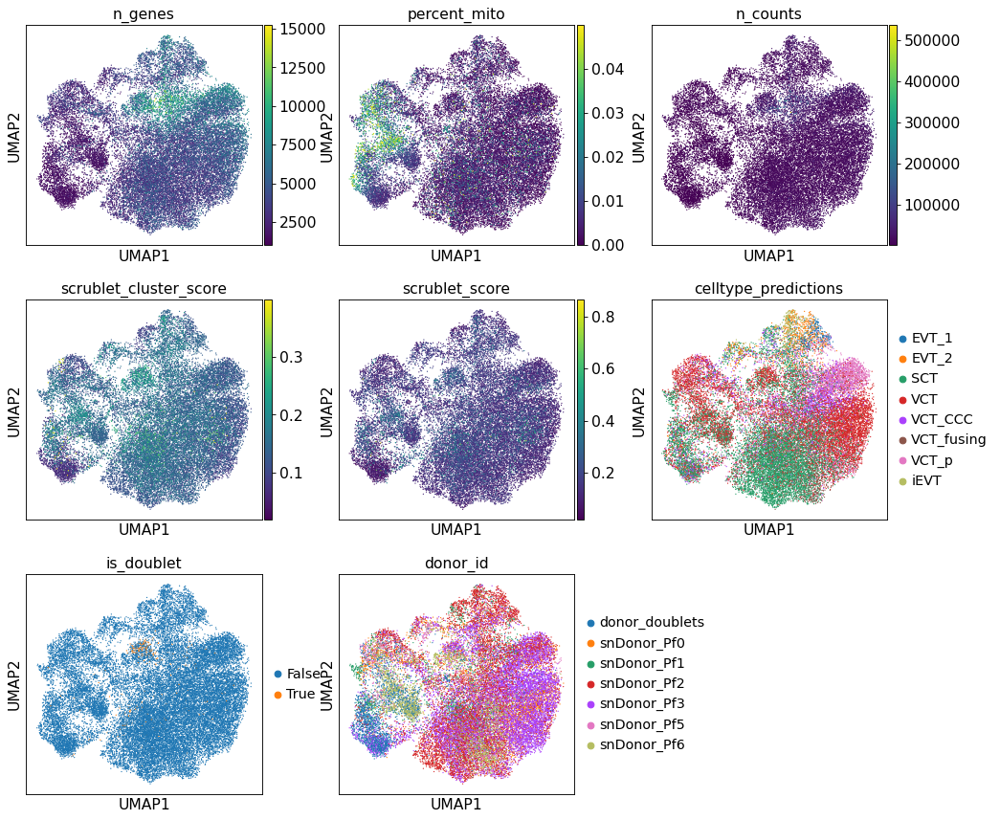

In [23]:
sc.pl.umap(Trophoblasts, color=["n_genes",'percent_mito','n_counts','scrublet_cluster_score',
                         'scrublet_score', 'celltype_predictions','is_doublet', 'donor_id'], ncols=3, size=5)

In [24]:
#sc.pl.umap(Trophoblasts, color="leiden_scvi", groups= "12", size=8)
#sc.pl.umap(Trophoblasts, color="leiden_scvi", groups= "14", size=8)

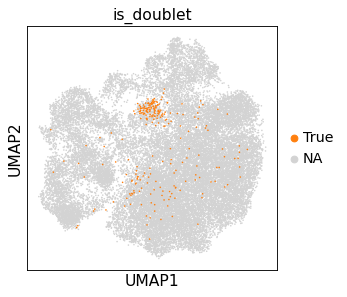

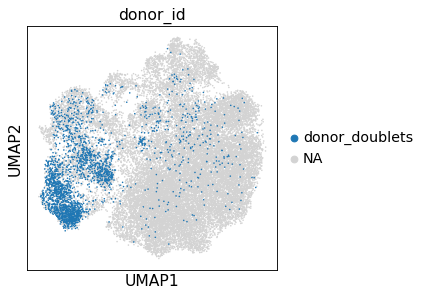

In [25]:
sc.pl.umap(Trophoblasts, color="is_doublet", groups= "True", size=8)
sc.pl.umap(Trophoblasts, color="donor_id", groups= "donor_doublets", size=8)

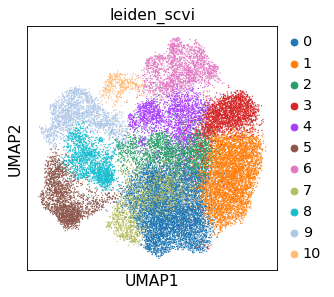

In [26]:
sc.pl.umap(Trophoblasts, color=["leiden_scvi"],size=5, ncols=2, wspace=0.3)

In [24]:
Trophoblasts

AnnData object with n_obs × n_vars = 28040 × 36601
    obs: 'sample', 'stage', 'donor', 'hpi', 'infection', 'percent_mito', 'n_counts', 'batch', 'n_genes', 'sample_barcode', 'assignment_SoC', 'donor_deconv', 'donor_souporcell', 'donor_id', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'infection_stage', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden_scvi', 'cell_typeAll', 'stage_perInfection', 'celltype_predictions', 'probabilities'
    var: 'gene_ids', 'feature_types', 'mean', 'std', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: '_scvi', 'donor_id_colors', 'hpi_colors', 'hvg', 'infection_colors', 'is_doublet_colors', 'leiden', 'neighbors', 'sample_colors', 'stage_perInfection_colors', 'umap', 'leiden_scvi_colors', 'phase_colors', 'celltype_predictions_colors', 'log1p'
    obsm: 'X_scVI_n_latent_15', 'X_scVI_n_latent_20', 'X_scVI

Cluster 5 & 11 look like doublets from both donors. Cluster 7 & 14 is a mixture of nuclei with low Quality.

The resolution wasn't enough to annotate the EVT sub-types, this will be done afterwards.


In [27]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
Trophoblasts.obs['cell_type']= Trophoblasts.obs['leiden_scvi']


#Function that changes the cluster names as indicated
Trophoblasts.obs['cell_type'] = (Trophoblasts.obs["leiden_scvi"].map(lambda x: 
                            {"0": "SCT", "1": "VCT", "2": "VCT", "3": "VCT", "4": "VCT","5": "doublets",
                            "6": "EVT", "7": "SCT", "8": "doublets", "9": "doublets", "10": "lowQC"}
                            .get(x, x)).astype("category"))

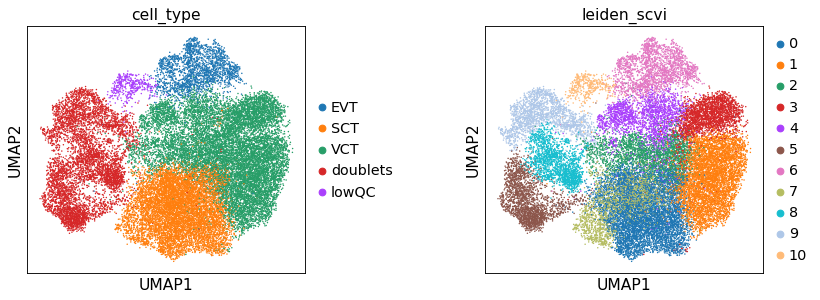

In [28]:
sc.pl.umap(Trophoblasts, color=['cell_type',"leiden_scvi"], wspace=0.5, size=7)

In [27]:
#Saving the modified object
#Trophoblasts.write('../results/scVI/snRNA5_scVIintegrated_latent30_TrophoblastsRaw_20230825.h5ad')

In [28]:
#Trophoblasts=sc.read('../results/scVI/snRNA6_scVIintegrated_latent30_Trophoblasts_20221010.h5ad')

### Removing lowQC and doublets nuclei

In [29]:
Trophoblasts = Trophoblasts[Trophoblasts.obs['cell_type'] != 'lowQC']
Trophoblasts = Trophoblasts[Trophoblasts.obs['cell_type'] != 'doublets']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [30]:
#LATENT 30
sc.pp.neighbors(Trophoblasts, n_neighbors=15, use_rep="X_scVI_n_latent_30")
sc.tl.umap(Trophoblasts)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


running Leiden clustering
    finished: found 8 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:03)


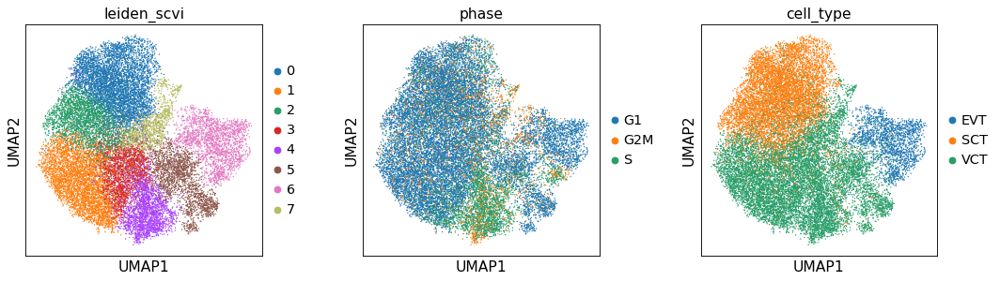

In [31]:
#clustering
sc.tl.leiden(Trophoblasts, key_added="leiden_scvi", resolution=0.5)


sc.pl.umap(Trophoblasts, color=["leiden_scvi",'phase','cell_type'],
           wspace=0.3, size=6)

In [32]:
Trophoblasts

AnnData object with n_obs × n_vars = 21849 × 36601
    obs: 'sample', 'stage', 'donor', 'hpi', 'infection', 'percent_mito', 'n_counts', 'batch', 'n_genes', 'sample_barcode', 'assignment_SoC', 'donor_deconv', 'donor_souporcell', 'donor_id', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'infection_stage', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden_scvi', 'cell_typeAll', 'stage_perInfection', 'celltype_predictions', 'probabilities', 'cell_type'
    var: 'gene_ids', 'feature_types', 'mean', 'std', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: '_scvi', 'donor_id_colors', 'hpi_colors', 'hvg', 'infection_colors', 'is_doublet_colors', 'leiden', 'neighbors', 'sample_colors', 'stage_perInfection_colors', 'umap', 'leiden_scvi_colors', 'phase_colors', 'celltype_predictions_colors', 'cell_typeAll_colors', 'log1p', 'cell_type_colors'
    o

In [33]:
#Saving the modified object
#Trophoblasts.write('../results/scVI/snRNA5_scVIintegrated_latent30_TrophoblastsRaw_20230825.h5ad')

# EVT Fine annotation

In [34]:
#Selecting the cells in the desired clusters
EVT = Trophoblasts[Trophoblasts.obs['cell_type'] == 'EVT']

#LATENT 30
sc.pp.neighbors(EVT, n_neighbors=15, use_rep="X_scVI_n_latent_30")
sc.tl.umap(EVT)


/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


running Leiden clustering
    finished: found 7 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:00)


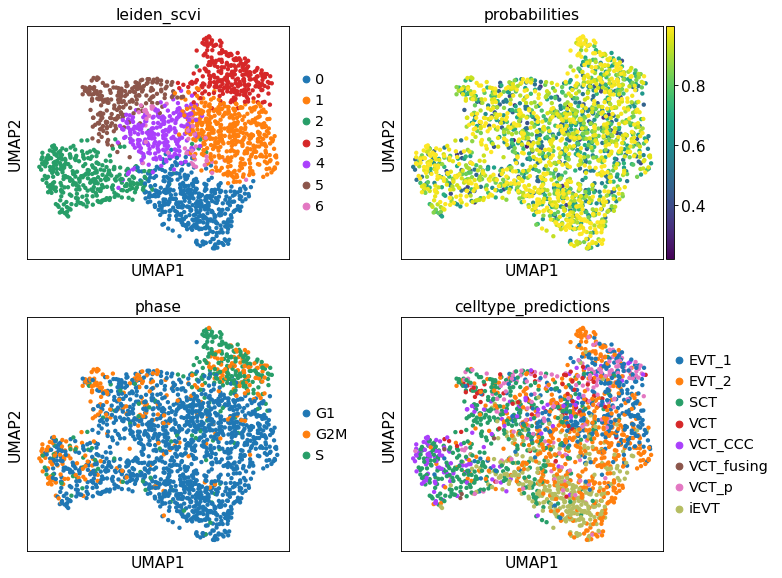

In [35]:

#clustering
sc.tl.leiden(EVT, key_added="leiden_scvi", resolution=0.9)


sc.pl.umap(EVT, color=["leiden_scvi",'probabilities','phase','celltype_predictions'],wspace=0.3,ncols=2, 
          save='_scVI_latent30_EVT_LogReg.pdf')

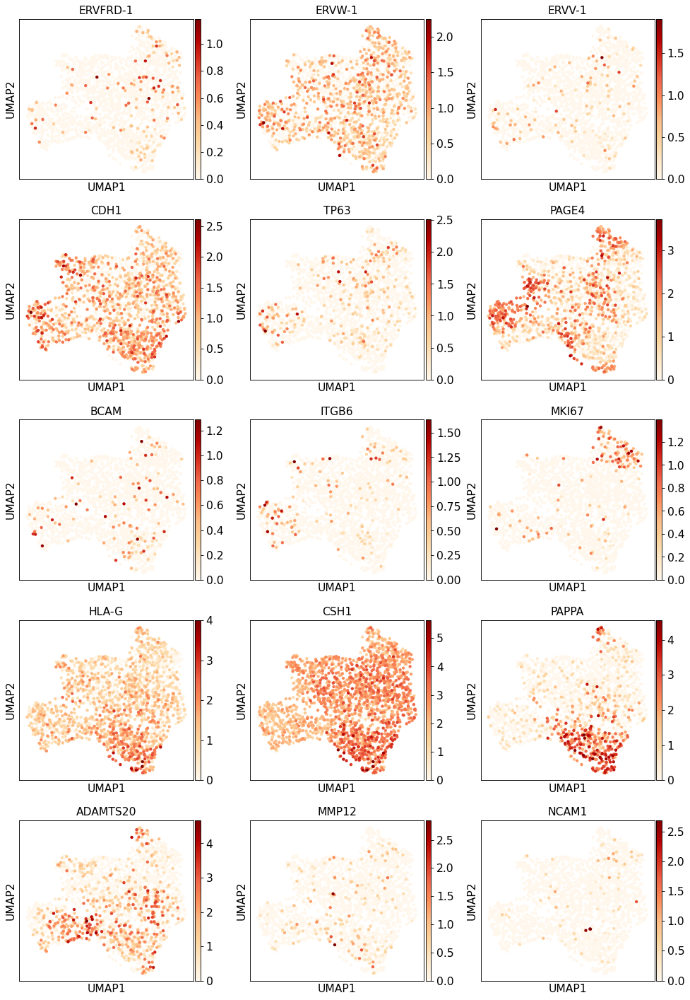

In [36]:
sc.pl.umap(EVT, color=['ERVFRD-1','ERVW-1','ERVV-1', #VCT-fusing
                       'CDH1','TP63','PAGE4','BCAM',  #VCT
                       'ITGB6',#VCT-CCC
                       'MKI67', #VCT-P
                         'HLA-G', 'CSH1', #EVT
                       'PAPPA',#iEVT
                         'ADAMTS20', #EVT1/2
                         'MMP12','NCAM1',  #eEVT
                         ], color_map='OrRd', ncols=3)

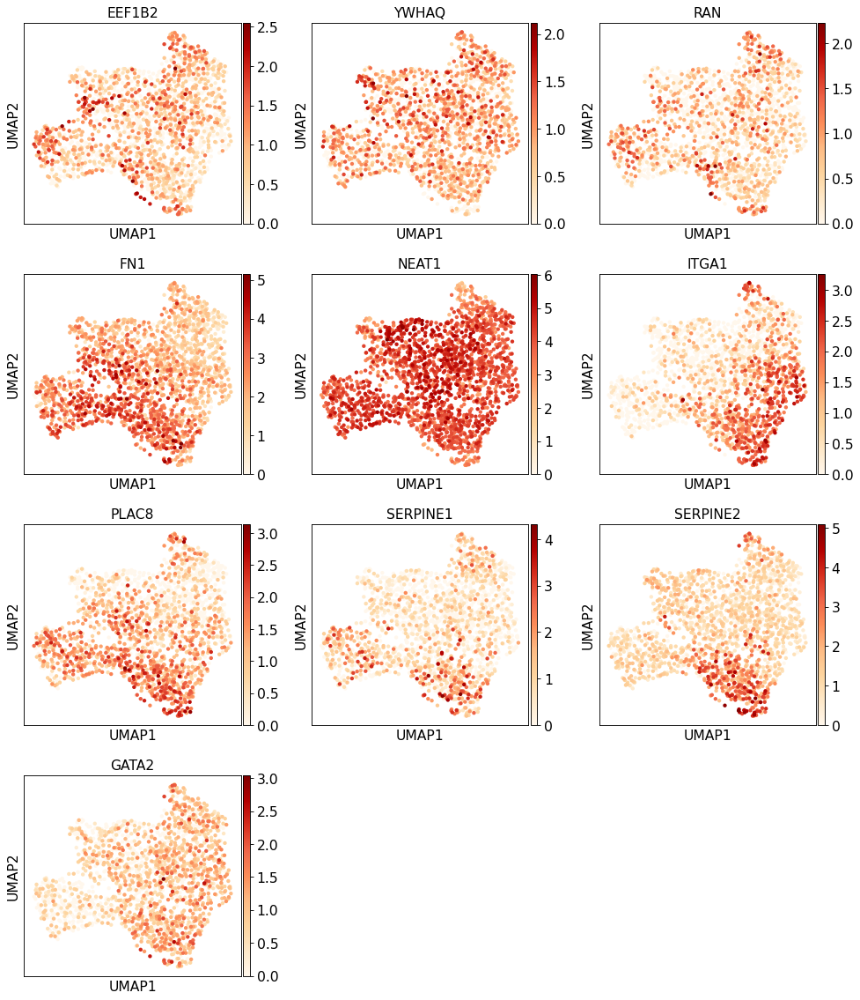

In [37]:
sc.pl.umap(EVT, color=['EEF1B2', 'YWHAQ','RAN',#EVT1
                       'FN1','NEAT1','ITGA1','PLAC8',  #EVT2
                       'SERPINE1','SERPINE2',#iEVT
                        'GATA2' ], color_map='OrRd', ncols=3 )

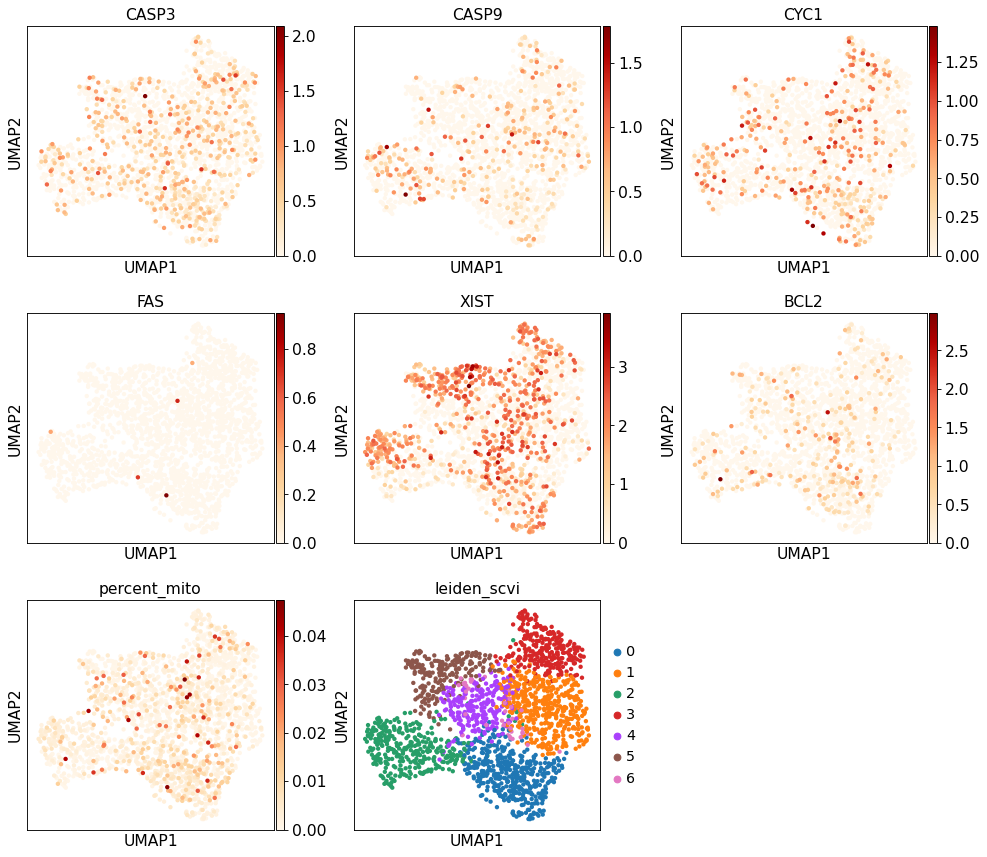

In [38]:
sc.pl.umap(EVT, color=['CASP3', 'CASP9', 'CYC1','FAS','XIST','BCL2', 'percent_mito','leiden_scvi'],
           color_map='OrRd',ncols=3)

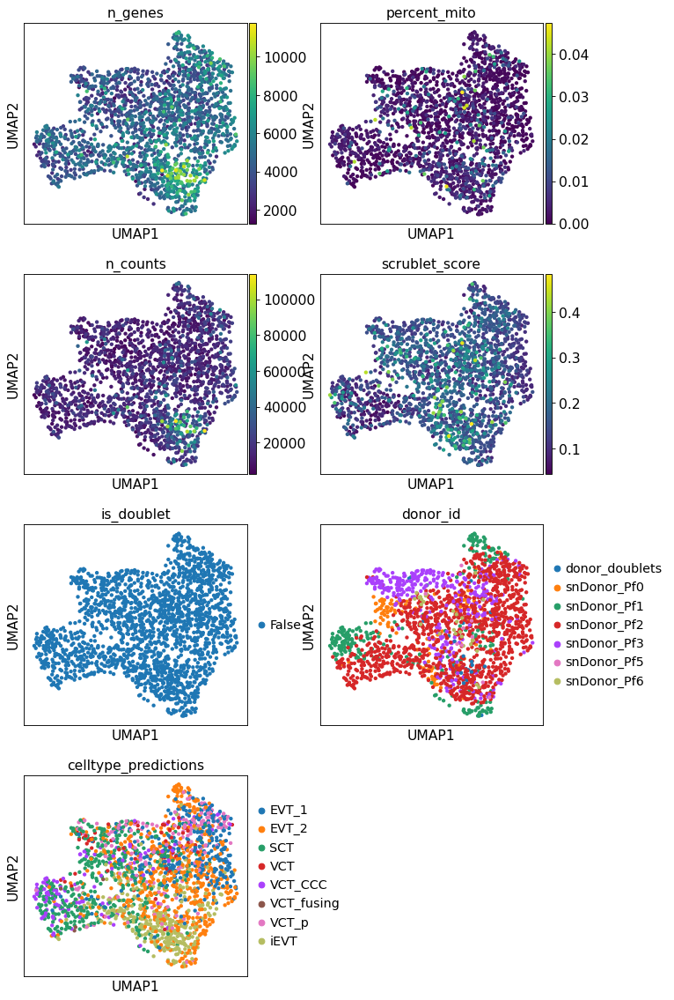

In [39]:
sc.pl.umap(EVT, color=["n_genes",'percent_mito','n_counts',
                         'scrublet_score', 'is_doublet','donor_id','celltype_predictions' ],ncols=2)

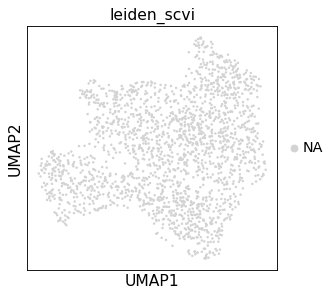

In [40]:
sc.pl.umap(EVT, color="leiden_scvi", groups= "11", size=20)

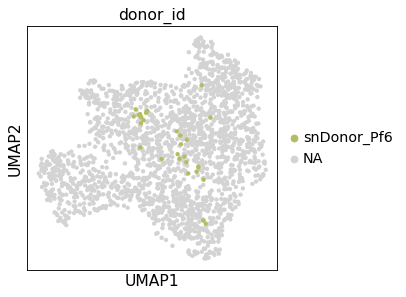

In [41]:
sc.pl.umap(EVT, color="donor_id", groups= "snDonor_Pf6")

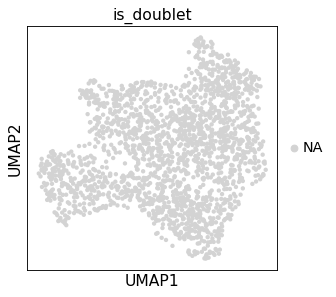

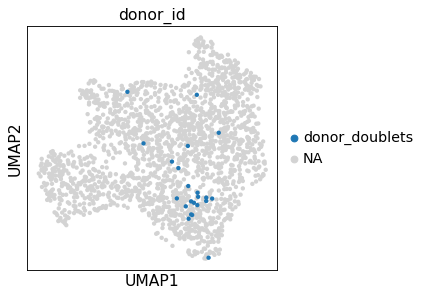

In [42]:
sc.pl.umap(EVT, color="is_doublet", groups= "True")
sc.pl.umap(EVT, color="donor_id", groups= "donor_doublets")

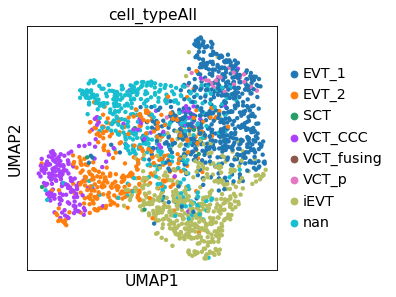

In [43]:
sc.pl.umap(EVT, color=["cell_typeAll"],wspace=0.3)

In [44]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
EVT.obs['cell_type']= EVT.obs['leiden_scvi']


#Function that changes the cluster names as indicated
EVT.obs['cell_type'] = (EVT.obs["leiden_scvi"].map(lambda x: 
                            {"0": "iEVT", "1": "EVT_2", "2": "VCT_CCC", "3": "EVT_1", "4": "EVT_2","5": "lowQC",
                            "6": "EVT_2"}
                            .get(x, x)).astype("category"))


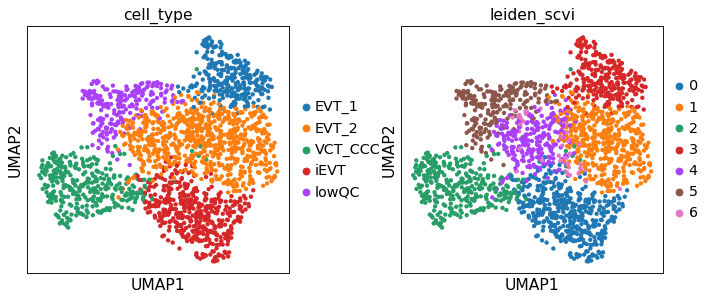

In [45]:
sc.pl.umap(EVT, color=['cell_type',"leiden_scvi"], wspace=0.3)


In [46]:
#Updating the new EVT annotation into the Trophoblast set
Trophoblasts= identityTransfer(EVT, Trophoblasts)

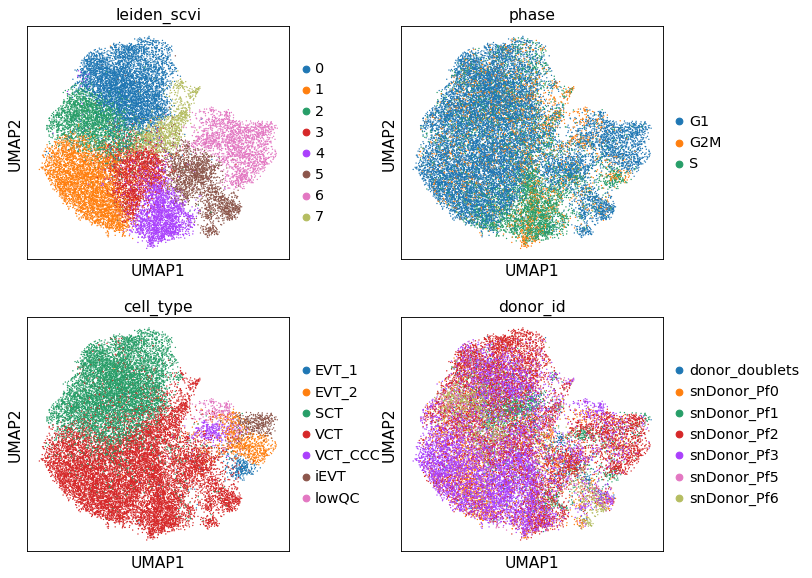

In [47]:
sc.pl.umap(Trophoblasts, color=["leiden_scvi",'phase','cell_type','donor_id'],
           wspace=0.3, size=6, ncols=2)

### Incresing granularity as this cluster "VCT" clearly have a mix of VCT_p and VCT_CCC

In [48]:
#Selecting the cells in the desired clusters
VCT = Trophoblasts[Trophoblasts.obs['cell_type'] == 'VCT']

#LATENT 30
sc.pp.neighbors(VCT, n_neighbors=15, use_rep="X_scVI_n_latent_30")
sc.tl.umap(VCT)


/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


running Leiden clustering
    finished: found 8 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:01)


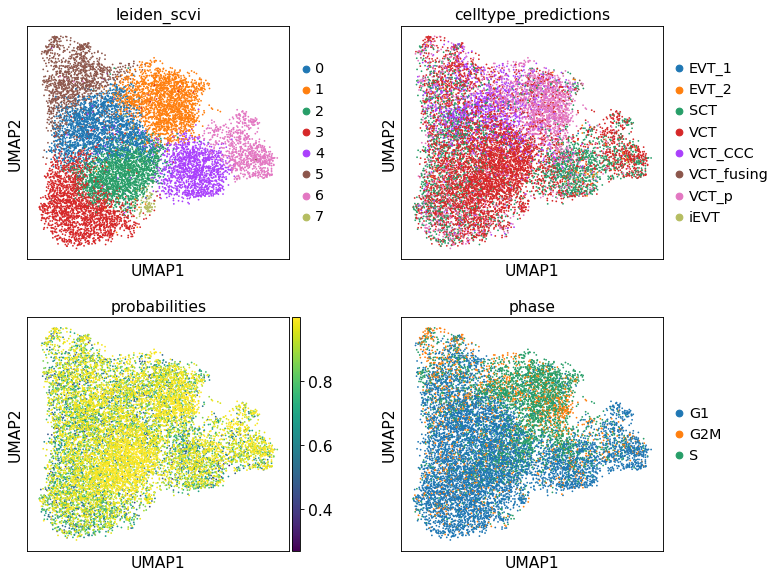

In [57]:

#clustering
sc.tl.leiden(VCT, key_added="leiden_scvi", resolution=0.6)


sc.pl.umap(VCT, color=["leiden_scvi", 'celltype_predictions','probabilities','phase',],ncols=2, wspace=0.3)

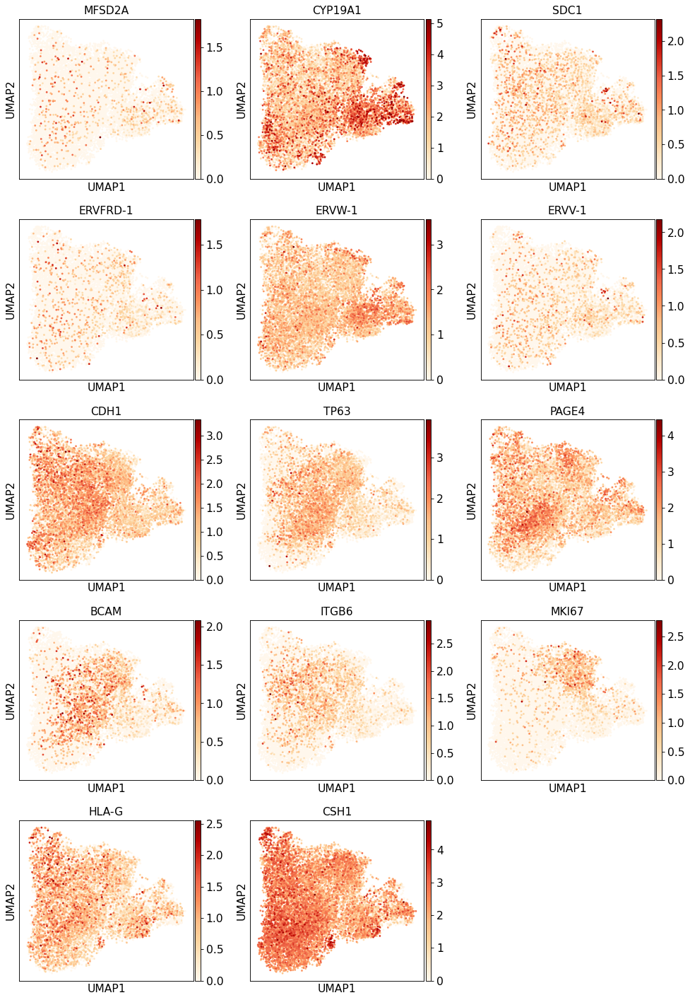

In [50]:
sc.pl.umap(VCT, color=['MFSD2A', #SCT
                       'CYP19A1','SDC1',#VCT-fusing & SCT
                       'ERVFRD-1','ERVW-1','ERVV-1', #VCT-fusing
                       'CDH1','TP63','PAGE4','BCAM',  #VCT
                       'ITGB6',#VCT-CCC
                       'MKI67', #VCT-P
                         'HLA-G', 'CSH1', #EVT
                         ], color_map='OrRd', ncols=3, size=25)

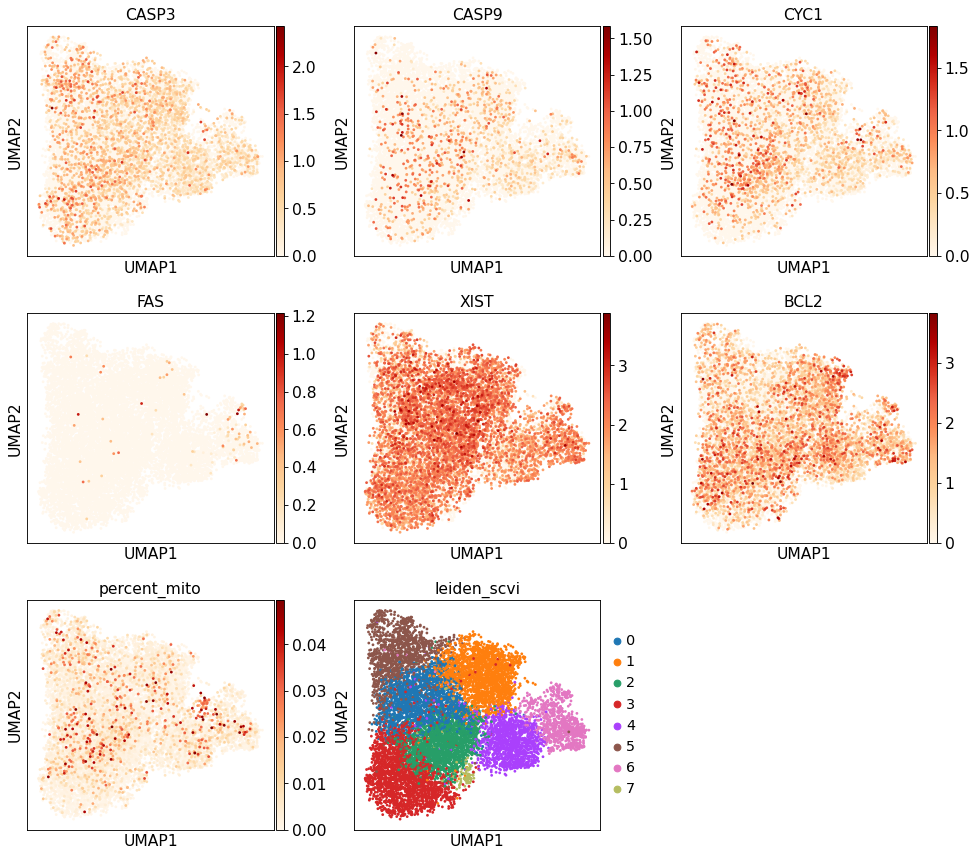

In [51]:
sc.pl.umap(VCT, color=['CASP3', 'CASP9', 'CYC1','FAS','XIST','BCL2', 'percent_mito','leiden_scvi'],
           color_map='OrRd',ncols=3, size=25)

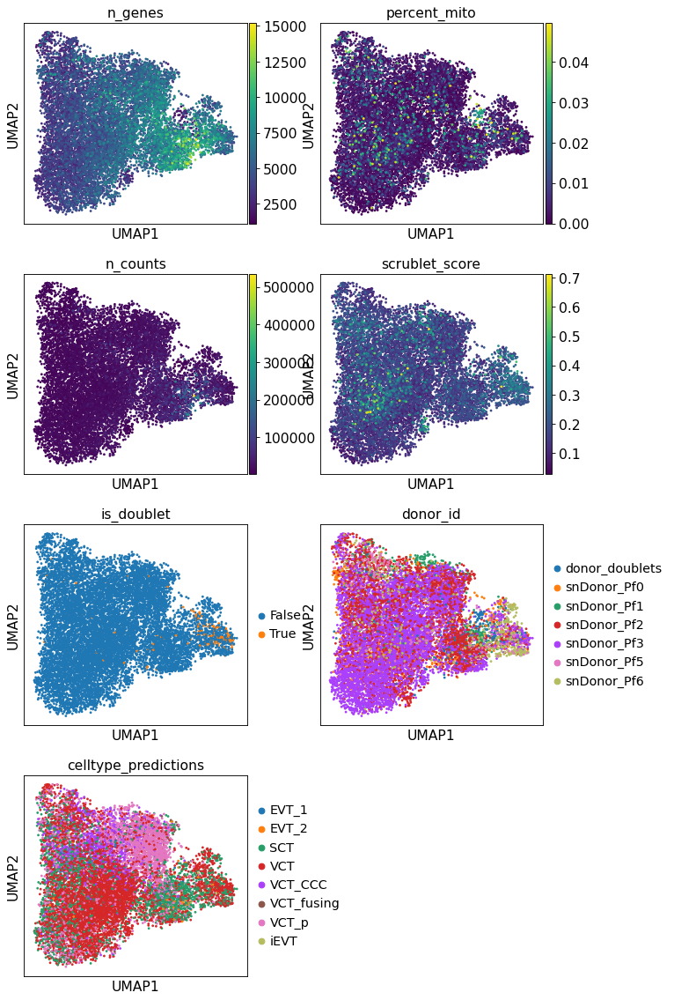

In [52]:
sc.pl.umap(VCT, color=["n_genes",'percent_mito','n_counts',
                         'scrublet_score', 'is_doublet','donor_id','celltype_predictions' ], ncols=2, size=25)

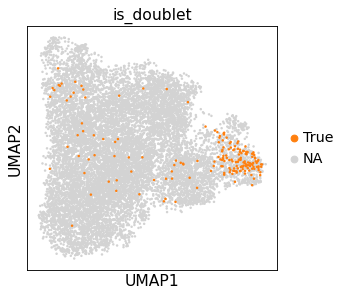

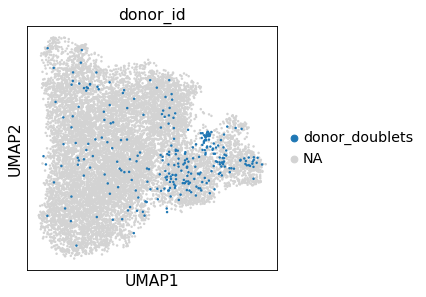

In [53]:
sc.pl.umap(VCT, color="is_doublet", groups= "True", size=20)
sc.pl.umap(VCT, color="donor_id", groups= "donor_doublets", size=20)

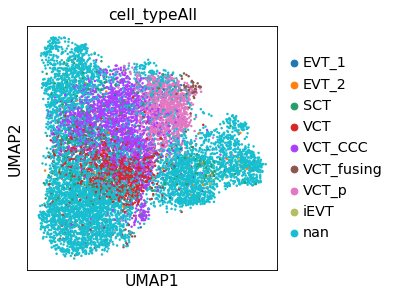

In [54]:
sc.pl.umap(VCT, color="cell_typeAll", size=20)

In [62]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
VCT.obs['cell_type']= VCT.obs['leiden_scvi']


#Function that changes the cluster names as indicated
VCT.obs['cell_type'] = (VCT.obs["leiden_scvi"].map(lambda x: 
                            {"0": "VCT_CCC", "1": "VCT_p", "2": "VCT", "3": "VCT", "4": "lowQC","5": "lowQC",
                            "6": "doublets","7": "VCT"}
                            .get(x, x)).astype("category"))


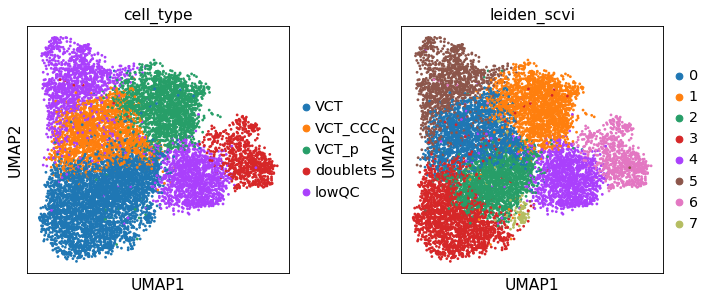

In [63]:
sc.pl.umap(VCT, color=['cell_type',"leiden_scvi"], wspace=0.3, size=25)

In [64]:
#Updating the new EVT annotation into the Trophoblast set
Trophoblasts= identityTransfer(VCT, Trophoblasts)

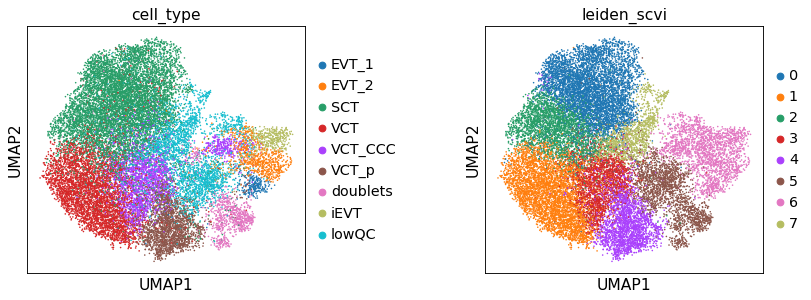

In [65]:
sc.pl.umap(Trophoblasts, color=['cell_type',"leiden_scvi"], wspace=0.5, size=8)

### Incresing granularity as this cluster "SCT" clearly have a mix of SCT and others

In [89]:
sc.set_figure_params(figsize=(4,4))

In [66]:
#Selecting the cells in the desired clusters
SCT = Trophoblasts[Trophoblasts.obs['cell_type'] == 'SCT']

#LATENT 30
sc.pp.neighbors(SCT, n_neighbors=15, use_rep="X_scVI_n_latent_30")
sc.tl.umap(SCT)


/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


running Leiden clustering
    finished: found 8 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:00)


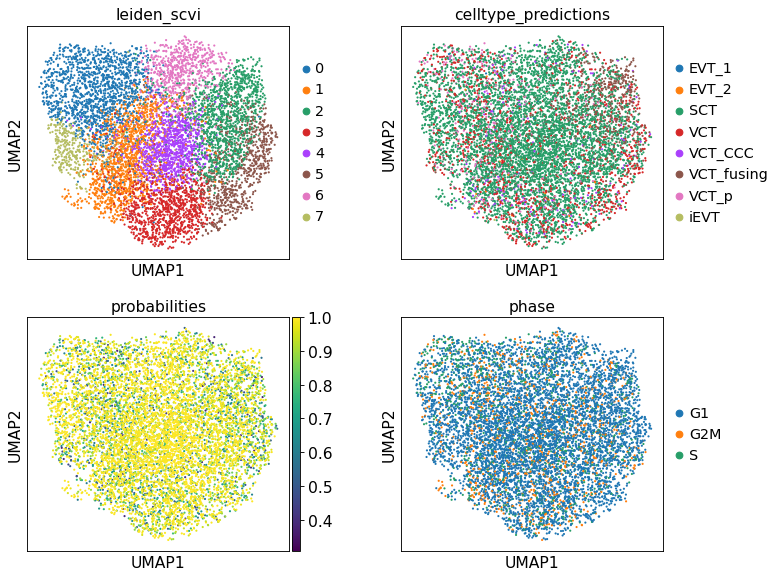

In [75]:

#clustering
sc.tl.leiden(SCT, key_added="leiden_scvi", resolution=0.7)


sc.pl.umap(SCT, color=["leiden_scvi", 'celltype_predictions','probabilities','phase',],ncols=2, wspace=0.3)

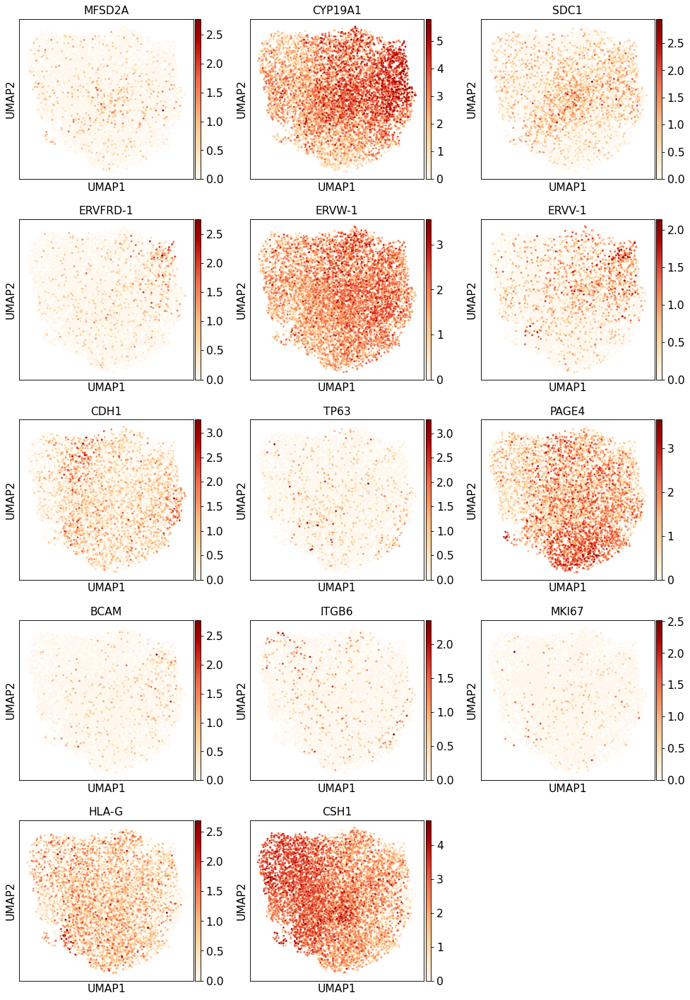

In [68]:
sc.pl.umap(SCT, color=['MFSD2A', #SCT
                       'CYP19A1','SDC1',#VCT-fusing & SCT
                       'ERVFRD-1','ERVW-1','ERVV-1', #VCT-fusing
                       'CDH1','TP63','PAGE4','BCAM',  #VCT
                       'ITGB6',#VCT-CCC
                       'MKI67', #VCT-P
                         'HLA-G', 'CSH1', #EVT
                         ], color_map='OrRd', ncols=3, size=25)

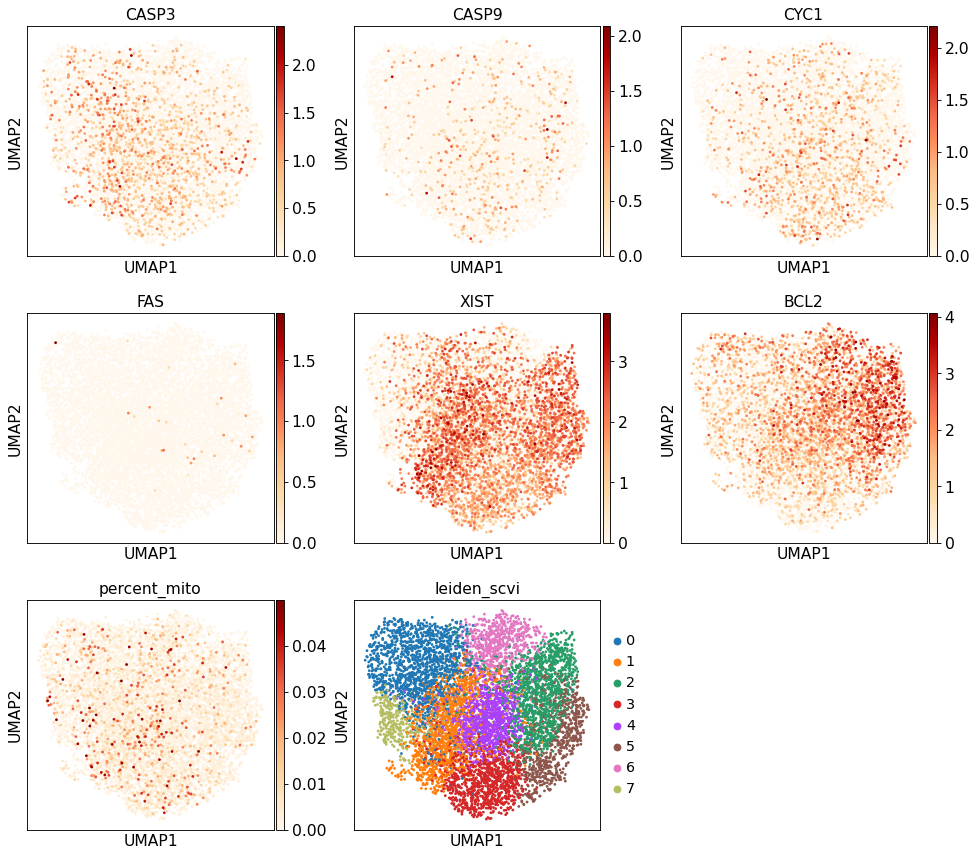

In [76]:
sc.pl.umap(SCT, color=['CASP3', 'CASP9', 'CYC1','FAS','XIST','BCL2', 'percent_mito','leiden_scvi'],
           color_map='OrRd',ncols=3, size=25)

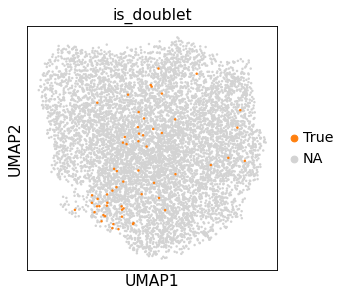

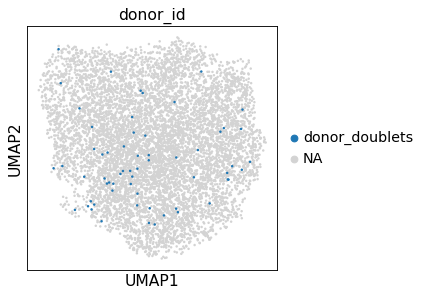

In [70]:
sc.pl.umap(SCT, color="is_doublet", groups= "True", size=20)
sc.pl.umap(SCT, color="donor_id", groups= "donor_doublets", size=20)

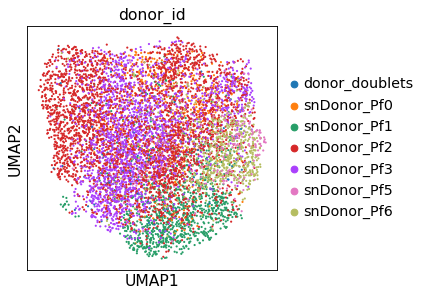

In [71]:


sc.pl.umap(SCT, color=['donor_id'], wspace=0.3)

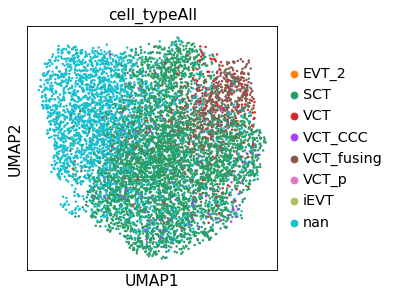

In [72]:
sc.pl.umap(SCT, color="cell_typeAll", size=20)

In [77]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
SCT.obs['cell_type']= SCT.obs['leiden_scvi']


#Function that changes the cluster names as indicated
SCT.obs['cell_type'] = (SCT.obs["leiden_scvi"].map(lambda x: 
                            {"0": "lowQC", "1": "SCT", "2": "VCT_fusing", "3": "SCT", "4": "SCT",
                            "5": "SCT","6": "SCT","7": "lowQC",}
                            .get(x, x)).astype("category"))


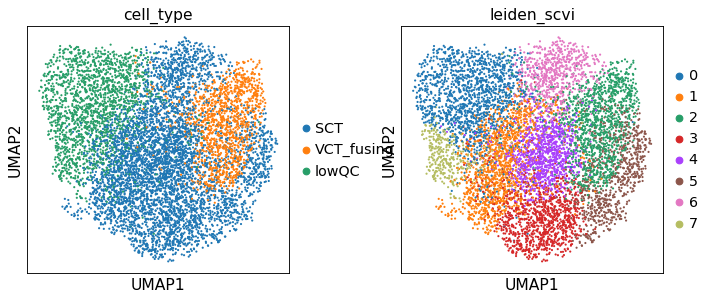

In [78]:
sc.pl.umap(SCT, color=['cell_type',"leiden_scvi"], wspace=0.3)

In [79]:
#Updating the new EVT annotation into the Trophoblast set
Trophoblasts= identityTransfer(SCT, Trophoblasts)

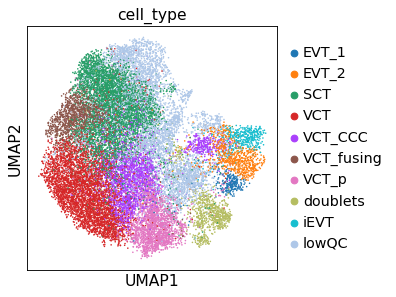

In [80]:
sc.pl.umap(Trophoblasts, color=['cell_type'], wspace=0.5, size=8)

In [81]:
temp= Trophoblasts.copy()

In [82]:
Trophoblasts= temp.copy()

### Removing doublets and lowQC

In [83]:
Trophoblasts = Trophoblasts[Trophoblasts.obs['cell_type'] != 'lowQC']
Trophoblasts = Trophoblasts[Trophoblasts.obs['cell_type'] != 'doublets']
Trophoblasts = Trophoblasts[Trophoblasts.obs['donor_id'] != 'donor_doublets']
Trophoblasts = Trophoblasts[Trophoblasts.obs['is_doublet'] != 'True']


/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


## Re-calculating coordinates

In [84]:
#LATENT 30
sc.pp.neighbors(Trophoblasts, n_neighbors=15, use_rep="X_scVI_n_latent_20")
sc.tl.umap(Trophoblasts)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


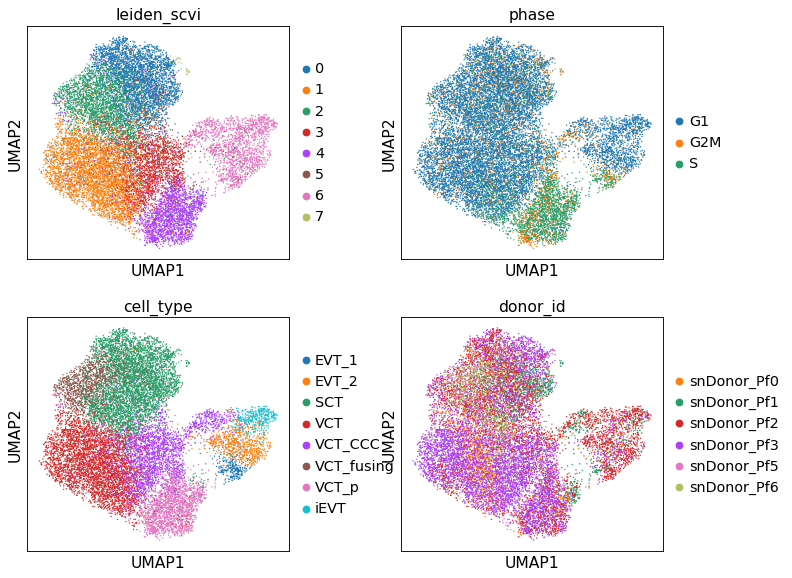

In [85]:
#clustering
#sc.tl.leiden(Trophoblasts, key_added="leiden_scvi", resolution=0.5)


sc.pl.umap(Trophoblasts, color=["leiden_scvi",'phase','cell_type',"donor_id"],
           wspace=0.3, size=6, ncols=2)

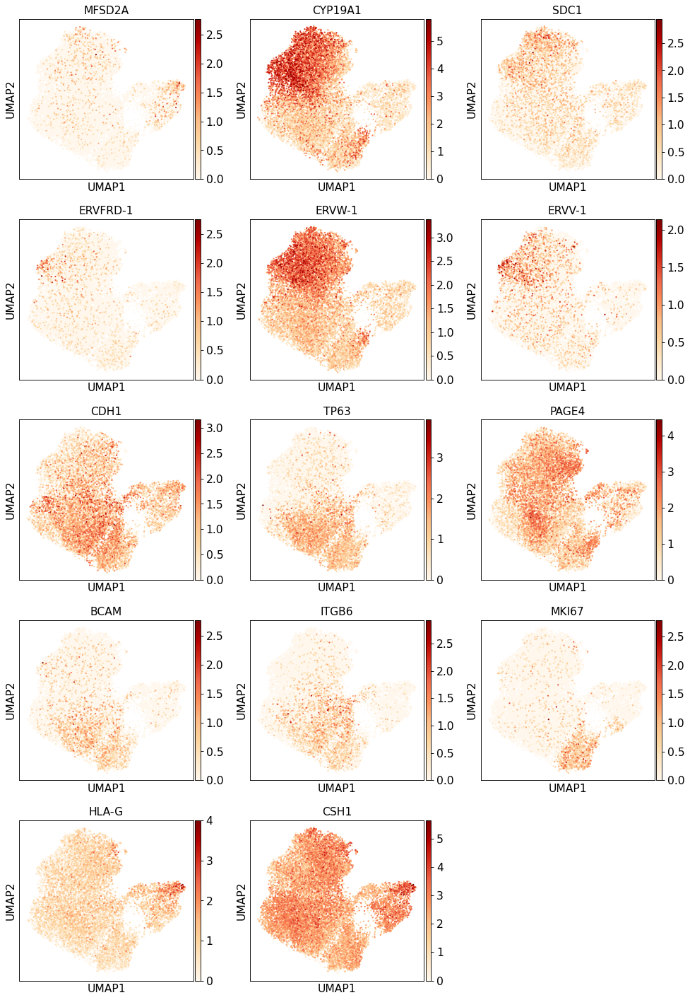

In [86]:
sc.pl.umap(Trophoblasts, color=['MFSD2A', #SCT
                       'CYP19A1','SDC1',#VCT-fusing & SCT
                       'ERVFRD-1','ERVW-1','ERVV-1', #VCT-fusing
                        'CDH1','TP63','PAGE4','BCAM',  #VCT
                       'ITGB6',#VCT-CCC
                       'MKI67', #VCT-P
                         'HLA-G', 'CSH1', #EVT
                         ], color_map='OrRd', ncols=3, size=15)

In [87]:
Trophoblasts.obs['donor_id'].values.describe()

,counts,freqs
categories,,
snDonor_Pf0,1740,0.108243
snDonor_Pf1,1686,0.104883
snDonor_Pf2,5049,0.314090
snDonor_Pf3,6625,0.412131
snDonor_Pf5,259,0.016112
snDonor_Pf6,716,0.044541


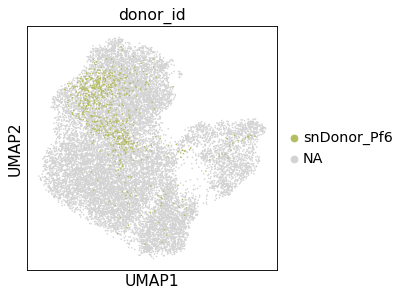

In [88]:
sc.pl.umap(Trophoblasts, color="donor_id", groups= "snDonor_Pf6", size=8)

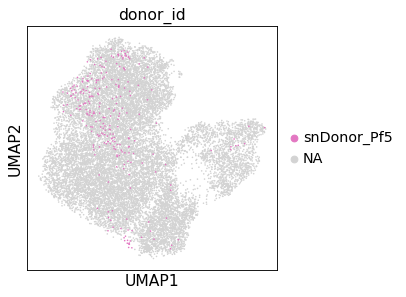

In [89]:
sc.pl.umap(Trophoblasts, color="donor_id", groups= "snDonor_Pf5", size=8)

## Saving data

In [90]:
Trophoblasts.X=Trophoblasts.layers['raw_counts'].copy()

In [91]:
#Saving the modified object
Trophoblasts.write('../results/scVI/snRNA5_scVIintegrated_latent30_TrophoblastsRaw_20230825.h5ad')

In [15]:
#DF with the row names as the identity of the cells
colors_final_df = pd.DataFrame(index = np.unique(Trophoblasts.obs['cell_type']))


#Assign each color per cell type under the column color
colors_final_df.loc['EVT_1', 'color'] = '#df3a82'
colors_final_df.loc['EVT_2', 'color'] = '#9e2f44'
colors_final_df.loc['SCT', 'color'] = '#d6bcc0'
colors_final_df.loc['VCT', 'color'] = '#7d87b9'
colors_final_df.loc['VCT_CCC', 'color'] = '#e996c3'
colors_final_df.loc['VCT_fusing', 'color'] = '#b53279'
colors_final_df.loc['VCT_p', 'color'] = '#f95d7f'
colors_final_df.loc['iEVT', 'color'] = '#93019f'


colors_final_dict= colors_final_df.to_dict()['color']

In [16]:
sc.set_figure_params(figsize=(5,5))

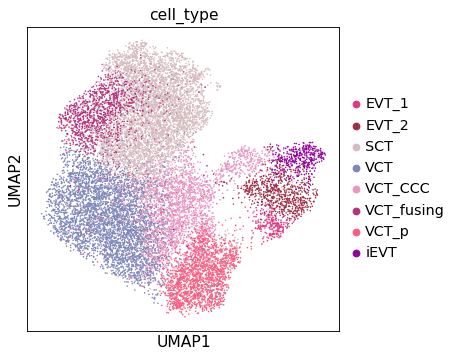

In [94]:
sc.pl.umap(Trophoblasts, color=['cell_type'], palette=colors_final_dict, size=8, save='_scVI_latent30_Trophoblasts.pdf')

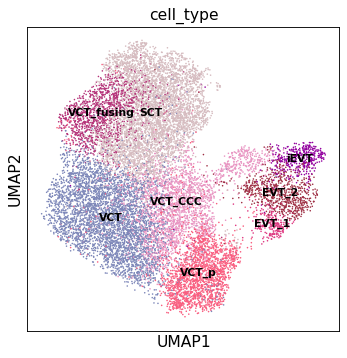

In [95]:
sc.pl.umap(Trophoblasts, color=['cell_type'], palette=colors_final_dict, size=8, legend_loc='on data',legend_fontsize='x-small',
           save='_scVI_latent30_Trophoblasts_ondata.pdf')

In [96]:
sc.set_figure_params(figsize=(5,5))

In [101]:
Trophoblasts.obs['stage_perInfection'].values.describe()

,counts,freqs
categories,,
Pf_24h,5096,0.317014
Pf_48h,2468,0.153530
UI_Pf_24h,4938,0.307185
UI_Pf_48h,3573,0.222271


In [102]:
Trophoblasts.obs['stage_perInfection']

Pla_HDBR11923126_AAACCCATCGTCTACC    UI_Pf_24h
Pla_HDBR11923126_AAACGAATCGCAACAT    UI_Pf_24h
Pla_HDBR11923126_AAACGCTTCGGCACTG    UI_Pf_24h
Pla_HDBR11923126_AAAGAACAGCAGTACG    UI_Pf_24h
Pla_HDBR11923126_AAAGAACGTCCATAGT    UI_Pf_24h
                                       ...    
Pla_HDBR13661578_TTCTTCCCACGTAACT       Pf_24h
Pla_HDBR13661578_TTGATGGAGAAGTATC       Pf_24h
Pla_HDBR13661578_TTGGATGGTATAGCTC       Pf_24h
Pla_HDBR13661578_TTGGGTACACCTGAAT       Pf_24h
Pla_HDBR13661578_TTTAGTCTCCTCGATC       Pf_24h
Name: stage_perInfection, Length: 16075, dtype: category
Categories (4, object): ['Pf_24h', 'Pf_48h', 'UI_Pf_24h', 'UI_Pf_48h']

### Adding identity+stage metadata

To create a column with values: *Identity - Stage*

In [103]:
Trophoblasts.obs['celltype-Stage']= Trophoblasts.obs.cell_type.astype('string')+'-'+Trophoblasts.obs.stage_perInfection.astype('string')

In [104]:
Trophoblasts.obs['celltype-Stage']=Trophoblasts.obs['celltype-Stage'].astype('category')

In [105]:
Trophoblasts.obs['celltype-Stage']

Pla_HDBR11923126_AAACCCATCGTCTACC        SCT-UI_Pf_24h
Pla_HDBR11923126_AAACGAATCGCAACAT        SCT-UI_Pf_24h
Pla_HDBR11923126_AAACGCTTCGGCACTG        SCT-UI_Pf_24h
Pla_HDBR11923126_AAAGAACAGCAGTACG       iEVT-UI_Pf_24h
Pla_HDBR11923126_AAAGAACGTCCATAGT        SCT-UI_Pf_24h
                                           ...        
Pla_HDBR13661578_TTCTTCCCACGTAACT    VCT_fusing-Pf_24h
Pla_HDBR13661578_TTGATGGAGAAGTATC           SCT-Pf_24h
Pla_HDBR13661578_TTGGATGGTATAGCTC       VCT_CCC-Pf_24h
Pla_HDBR13661578_TTGGGTACACCTGAAT    VCT_fusing-Pf_24h
Pla_HDBR13661578_TTTAGTCTCCTCGATC           SCT-Pf_24h
Name: celltype-Stage, Length: 16075, dtype: category
Categories (32, object): ['EVT_1-Pf_24h', 'EVT_1-Pf_48h', 'EVT_1-UI_Pf_24h', 'EVT_1-UI_Pf_48h', ..., 'iEVT-Pf_24h', 'iEVT-Pf_48h', 'iEVT-UI_Pf_24h', 'iEVT-UI_Pf_48h']

### Adding Donor + celltype-Stage metadata

To create a column with values: *Donor - celltype-Stage*

In [106]:
Trophoblasts.obs['donor_stage']= Trophoblasts.obs['donor_id'].astype('string')+'_'+ Trophoblasts.obs['celltype-Stage'].astype('string')

In [107]:
Trophoblasts.obs['donor_stage']=Trophoblasts.obs['donor_stage'].astype('category')

## Checking the number of nuclei per infection- per cell type

In [108]:
plt.rcParams['font.size'] = '2'
sc.set_figure_params(figsize=(15,5))

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]),
 [Text(0, 0, 'EVT_1-Pf_24h'),
  Text(1, 0, 'EVT_1-Pf_48h'),
  Text(2, 0, 'EVT_1-UI_Pf_24h'),
  Text(3, 0, 'EVT_1-UI_Pf_48h'),
  Text(4, 0, 'EVT_2-Pf_24h'),
  Text(5, 0, 'EVT_2-Pf_48h'),
  Text(6, 0, 'EVT_2-UI_Pf_24h'),
  Text(7, 0, 'EVT_2-UI_Pf_48h'),
  Text(8, 0, 'SCT-Pf_24h'),
  Text(9, 0, 'SCT-Pf_48h'),
  Text(10, 0, 'SCT-UI_Pf_24h'),
  Text(11, 0, 'SCT-UI_Pf_48h'),
  Text(12, 0, 'VCT-Pf_24h'),
  Text(13, 0, 'VCT-Pf_48h'),
  Text(14, 0, 'VCT-UI_Pf_24h'),
  Text(15, 0, 'VCT-UI_Pf_48h'),
  Text(16, 0, 'VCT_CCC-Pf_24h'),
  Text(17, 0, 'VCT_CCC-Pf_48h'),
  Text(18, 0, 'VCT_CCC-UI_Pf_24h'),
  Text(19, 0, 'VCT_CCC-UI_Pf_48h'),
  Text(20, 0, 'VCT_fusing-Pf_24h'),
  Text(21, 0, 'VCT_fusing-Pf_48h'),
  Text(22, 0, 'VCT_fusing-UI_Pf_24h'),
  Text(23, 0, 'VCT_fusing-UI_Pf_48h'),
  Text(24, 0, 'VCT_p-Pf_24h'),
  Text(25, 0, 'VCT_p-Pf_48h'),
  Text(26,

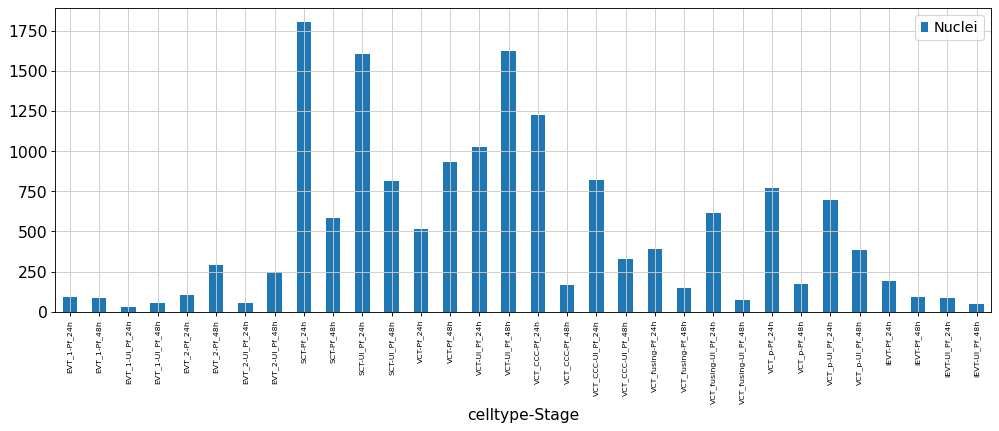

In [109]:
dfPlot= Trophoblasts.obs['celltype-Stage'].values.describe()
dfPlot['celltype-Stage']=dfPlot.index
dfPlot= dfPlot.rename(columns={"counts": "Nuclei"})



dfPlot.plot.bar(x='celltype-Stage', y='Nuclei', rot=90 )

# Adjust the size of x-axis labels
plt.xticks(fontsize=7)  # You can adjust the fontsize to your preference


(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116]),
 [Text(0, 0, 'snDonor_Pf0_EVT_1-Pf_24h'),
  Text(1, 0, 'snDonor_Pf0_EVT_1-UI_Pf_24h'),
  Text(2, 0, 'snDonor_Pf0_EVT_2-Pf_24h'),
  Text(3, 0, 'snDonor_Pf0_EVT_2-UI_Pf_24h'),
  Text(4, 0, 'snDonor_Pf0_SCT-Pf_24h'),
  Text(5, 0, 'snDonor_Pf0_SCT-UI_Pf_24h'),
  Text(6, 0, 'snDonor_Pf0_VCT-Pf_24h'),
  Text(7, 0, 'snDonor_Pf0_VCT-UI_Pf_24h'),
 

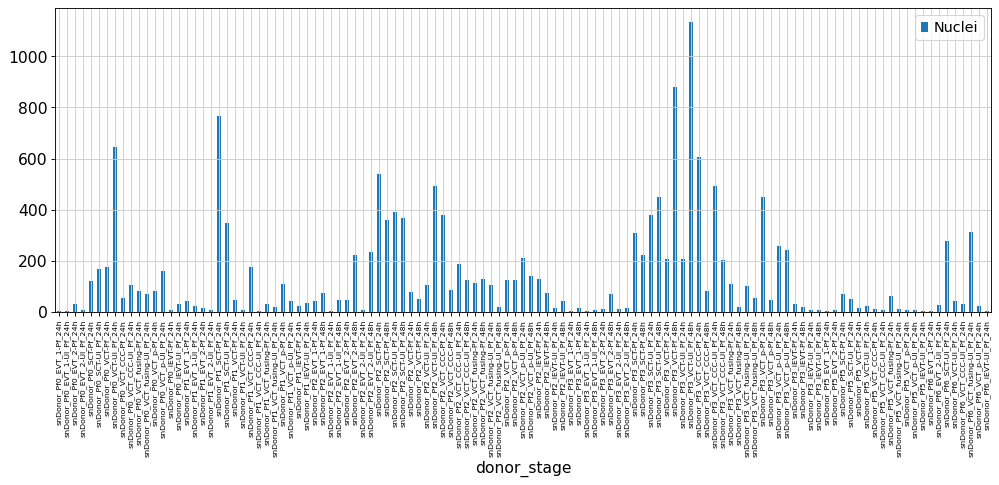

In [110]:
dfPlot= Trophoblasts.obs['donor_stage'].values.describe()
dfPlot['donor_stage']=dfPlot.index
dfPlot= dfPlot.rename(columns={"counts": "Nuclei"})



dfPlot.plot.bar(x='donor_stage', y='Nuclei', rot=90 )

# Adjust the size of x-axis labels
plt.xticks(fontsize=7)  # You can adjust the fontsize to your preference


In [111]:
Trophoblasts.obs['donor_stage'].values.describe().tail(20)

,counts,freqs
categories,,
snDonor_Pf5_EVT_2-Pf_24h,5,0.000311
snDonor_Pf5_SCT-Pf_24h,69,0.004292
snDonor_Pf5_SCT-UI_Pf_24h,48,0.002986
snDonor_Pf5_VCT-Pf_24h,13,0.000809
snDonor_Pf5_VCT-UI_Pf_24h,21,0.001306
snDonor_Pf5_VCT_CCC-Pf_24h,11,0.000684
snDonor_Pf5_VCT_CCC-UI_Pf_24h,7,0.000435
snDonor_Pf5_VCT_fusing-Pf_24h,62,0.003857
snDonor_Pf5_VCT_fusing-UI_Pf_24h,9,0.000560


### Too few cells in SCT for snDonor_Pf6. We will need to remove them as it is not useful for downstream analysis

In [112]:
Trophoblasts = Trophoblasts[Trophoblasts.obs['donor_id'] != 'snDonor_Pf6']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [113]:
Trophoblasts = Trophoblasts[Trophoblasts.obs['donor_id'] != 'snDonor_Pf5']

### Saving the data

In [114]:
Trophoblasts.X=Trophoblasts.layers['raw_counts'].copy()

In [115]:
#Saving the modified object
Trophoblasts.write('../results/scVI/snRNA5_scVIintegrated_latent30_TrophoblastsRaw_20230825.h5ad')

In [165]:
Trophoblasts

View of AnnData object with n_obs × n_vars = 17890 × 36601
    obs: 'sample', 'stage', 'donor', 'hpi', 'infection', 'percent_mito', 'n_counts', 'batch', 'n_genes', 'sample_barcode', 'assignment_SoC', 'donor_deconv', 'donor_souporcell', 'donor_id', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'infection_stage', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden_scvi', 'cell_typeAll', 'stage_perInfection', 'celltype_predictions', 'probabilities', 'cell_type', 'celltype-Stage', 'donor_stage'
    var: 'gene_ids', 'feature_types', 'mean', 'std', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: '_scvi', 'donor_id_colors', 'hpi_colors', 'hvg', 'infection_colors', 'is_doublet_colors', 'leiden', 'neighbors', 'sample_colors', 'stage_perInfection_colors', 'umap', 'leiden_scvi_colors', 'phase_colors', 'celltype_predictions_colors', 'log1p', 'cell_

## Keeping only 24h

In [10]:
Trophoblasts = Trophoblasts[Trophoblasts.obs['hpi'] == '24h']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [11]:
Trophoblasts.obs['stage_perInfection'].values.describe()

,counts,freqs
categories,,
Pf_24h,4929,0.5441
UI_Pf_24h,4130,0.4559


In [19]:
#LATENT 30
sc.pp.neighbors(Trophoblasts, n_neighbors=15, use_rep="X_scVI_n_latent_20")
sc.tl.umap(Trophoblasts)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


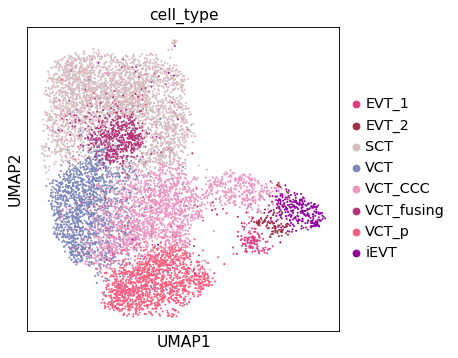

In [20]:
sc.pl.umap(Trophoblasts, color=['cell_type'], palette=colors_final_dict)

In [21]:
#Saving the modified object
Trophoblasts.write('../results/scVI/snRNA5_scVIintegrated_latent30_TrophoblastsRaw_20230825_24h.h5ad')

In [8]:
#Trophoblasts= sc.read('../results/scVI/snRNA5_scVIintegrated_latent30_TrophoblastsRaw_20230825.h5ad')